<a href="https://colab.research.google.com/github/oliviks/census_income/blob/main/Kiepek__census_income_balanced.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

https://archive.ics.uci.edu/dataset/20/census+income

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from imblearn.under_sampling import RandomUnderSampler
from sklearn.utils import resample
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Train set - presampled

## Loading the original df

In [2]:
names= 'age, workclass, fnlwgt, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loss, hours-per-week, native-country, income'


In [3]:
col_names = names.split(', ')

In [4]:
col_names

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [5]:
df_train = pd.read_csv('/content/drive/MyDrive/ML_final_project/adult_data_train.csv',names=col_names)

## Train set modifications

In [8]:
categorical_columns = df_train.select_dtypes(include=['object']).columns

In [9]:
categorical_columns

Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'race', 'sex', 'native-country', 'income'],
      dtype='object')

In [12]:
df_train.rename(columns={'marital-status': 'marital_status'}, inplace=True)

In [18]:
df_train.rename(columns={'native-country': 'native_country'}, inplace=True)

In [21]:
df_train = pd.get_dummies(df_train, columns=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'], prefix=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'])

In [23]:
pd.set_option('display.max_columns', None)

In [24]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K,income_ >50K
0,39,77516,13,2174,0,40,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
1,50,83311,13,0,0,13,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
2,38,215646,9,0,0,40,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,F

In [25]:
boolean_columns = df_train.select_dtypes(include=['bool']).columns
print(list(boolean_columns))

['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers

In [26]:
df_train[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_train[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

In [27]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K,income_ >50K
0,39,77516,13,2174,0,40,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
1,50,83311,13,0,0,13,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
2,38,215646,9,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3,53,234721,7,0,0,40,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
4,28,338409,13,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [28]:
df_train = df_train.drop('income_ <=50K', axis = 1)

## Sampling

In [29]:
income_percentages = df_train['income_ >50K'].value_counts(normalize=True) * 100
print(income_percentages)

income_ >50K
0    75.919044
1    24.080956
Name: proportion, dtype: float64


### Under/Oversampler

#### **The following method did not give me the desired 50-50 ratio, however, the ds became MORE balanced**:

In [ ]:
"""# Setting the random seed for reproducibility
random_seed = 42

X = df_train.drop(columns=['income_ >50K'])
y = df_train['income_ >50K']

class_counts = y.value_counts()
minority_class = class_counts.idxmin()
majority_class = class_counts.idxmax()

minority_class_count = int(0.5 * len(y))
majority_class_count = int(0.5 * len(y))

desired_ratio = {
    minority_class: min(minority_class_count, class_counts[minority_class]),
    majority_class: min(majority_class_count, class_counts[majority_class])
}

print("Original class distribution:", y.value_counts(normalize=True))

if desired_ratio[minority_class] > class_counts[minority_class]:
    sampler = RandomOverSampler(sampling_strategy=desired_ratio, random_state=random_seed)
else:
    sampler = RandomUnderSampler(sampling_strategy=desired_ratio, random_state=random_seed)

X_resampled, y_resampled = sampler.fit_resample(X, y)

print("Resampled class distribution:", y_resampled.value_counts(normalize=True))

resampled_train_df = X_resampled.copy()
resampled_train_df['income_ >50K'] = y_resampled

resampled_train_df.head()"""


Original class distribution: income_ >50K
0    0.75919
1    0.24081
Name: proportion, dtype: float64
Resampled class distribution: income_ >50K
0    0.674931
1    0.325069
Name: proportion, dtype: float64


,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
0,32,43403,10,0,1590,54,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1,19,182609,9,0,0,25,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2,51,332243,13,0,0,45,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,27,158156,9,0,0,42,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,64,170421,10,0,0,8,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


#### **To achieve a balanced 50-50 ratio, I need to use SMOTE to oversample the minority class and then use an undersampling technique to reduce the majority class**:

In [32]:
# Setting the random seed for reproducibility
random_seed = 42


X = df_train.drop(columns=['income_ >50K'])
y = df_train['income_ >50K']

class_counts = y.value_counts()
minority_class = class_counts.idxmin()
majority_class = class_counts.idxmax()

# Calculating the total number of samples for a 50-50 ratio
total_count = len(y)
desired_minority_count = total_count // 2
desired_majority_count = total_count // 2

print("Original class distribution:", y.value_counts(normalize=True))

# Defining the resampling strategy
over = SMOTE(sampling_strategy={minority_class: desired_minority_count}, random_state=random_seed)
under = RandomUnderSampler(sampling_strategy={majority_class: desired_majority_count}, random_state=random_seed)

# Creating a pipeline
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

# Applying the pipeline to the data
X_resampled, y_resampled = pipeline.fit_resample(X, y)

print("Resampled class distribution:", y_resampled.value_counts(normalize=True))

# Combining the resampled features and target into a new DataFrame
resampled_train_df = X_resampled.copy()
resampled_train_df['income_ >50K'] = y_resampled

resampled_train_df.head()


Original class distribution: income_ >50K
0    0.75919
1    0.24081
Name: proportion, dtype: float64
Resampled class distribution: income_ >50K
0    0.5
1    0.5
Name: proportion, dtype: float64


,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
0,32,43403,10,0,1590,54,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,51,332243,13,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,27,158156,9,0,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,64,170421,10,0,0,8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


Saving the new df:

In [33]:
file_path = '/content/drive/MyDrive/ML_final_project/BALANCED_resampled_train_df.csv'

resampled_train_df.to_csv(file_path, index=False)

print(f"DataFrame saved to {file_path}")

DataFrame saved to /content/drive/MyDrive/ML_final_project/BALANCED_resampled_train_df.csv


# Train set (with proper ratios) modification

In [34]:
df_train = pd.read_csv('/content/drive/MyDrive/ML_final_project/BALANCED_resampled_train_df.csv')

In [35]:
pd.set_option('display.max_columns', None)

In [36]:
df_train.shape

(32560, 109)

In [37]:
df_train.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
0,32,43403,10,0,1590,54,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
2,51,332243,13,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
3,27,158156,9,0,0,42,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,64,170421,10,0,0,8,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0


In [38]:
print(df_train.columns)

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov',
       'workclass_ Local-gov', 'workclass_ Never-worked',
       ...
       'native_country_ Puerto-Rico', 'native_country_ Scotland',
       'native_country_ South', 'native_country_ Taiwan',
       'native_country_ Thailand', 'native_country_ Trinadad&Tobago',
       'native_country_ United-States', 'native_country_ Vietnam',
       'native_country_ Yugoslavia', 'income_ >50K'],
      dtype='object', length=109)


In [39]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [40]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Columns: 109 entries, age to income_ >50K
dtypes: int64(109)
memory usage: 27.1 MB


In [41]:
# 1. Using describe() for a statistical summary
print(df_train.describe(include='all'))

# 2. Using DataFrame.dtypes to get the data types of all columns
print(df_train.dtypes)

# 3. Using a loop to print detailed information about each column
for column in df_train.columns:
    print(f"Column: {column}")
    print(f"Unique values: {df_train[column].nunique()}")
    #print(f"Missing values: {df_train[column].isnull().sum()}")
    print(f"Data type: {df_train[column].dtype}")
    print("-" * 40)


                age        fnlwgt  education-num  capital-gain  capital-loss  \
count  32560.000000  3.256000e+04   32560.000000  32560.000000  32560.000000   
mean      40.377027  1.899227e+05      10.504484   2034.992045    122.816585   
std       12.540807  1.050479e+05       2.492911  10399.383487    475.412769   
min       17.000000  1.487800e+04       1.000000      0.000000      0.000000   
25%       31.000000  1.184710e+05       9.000000      0.000000      0.000000   
50%       40.000000  1.780680e+05      10.000000      0.000000      0.000000   
75%       49.000000  2.368535e+05      13.000000      0.000000      0.000000   
max       90.000000  1.484705e+06      16.000000  99999.000000   4356.000000   

       hours-per-week  workclass_ ?  workclass_ Federal-gov  \
count    32560.000000  32560.000000            32560.000000   
mean        42.083722      0.039281                0.023894   
std         11.632770      0.194266                0.152722   
min          1.000000      

In [42]:
# 4. Combining column-specific information into a DataFrame
detailed_info = pd.DataFrame({
    'Column': df_train.columns,
    'Non-Null Count': df_train.notnull().sum(),  # remember: NULLs are represented by ' ?'
 #   'Null Count': df_train.isnull().sum(),
    'Unique Count': df_train.nunique(),
    'Dtype': df_train.dtypes
})

detailed_info

,Column,Non-Null Count,Unique Count,Dtype
age,age,32560,71,int64
fnlwgt,fnlwgt,32560,24147,int64
education-num,education-num,32560,16,int64
capital-gain,capital-gain,32560,932,int64
capital-loss,capital-loss,32560,482,int64
hours-per-week,hours-per-week,32560,99,int64
workclass_ ?,workclass_ ?,32560,2,int64
workclass_ Federal-gov,workclass_ Federal-gov,32560,2,int64
workclass_ Local-gov,workclass_ Local-gov,32560,2,int64
workclass_ Never-worked,workclass_ Never-worked,32560,2,int64


List of dummies representing NA values:

In [43]:
# List to store column names with the suffix "_ ?"
columns_with_suffix = []

# Iterating through each column in the DataFrame
for column in df_train.columns:
    if column.endswith('_ ?'):
        columns_with_suffix.append(column)

print("Columns with the suffix '_ ?':")
for column in columns_with_suffix:
    print(column)


Columns with the suffix '_ ?':
workclass_ ?
occupation_ ?
native_country_ ?


In [44]:
# Initializing a dictionary to store the count of 1s (which represent NULL values) for each column
null_value_counts = {}

# Iterating through each column with the suffix '_ ?' and counting the occurrences of 1s
for column in columns_with_suffix:
    null_value_counts[column] = df_train[column].sum()

print("Count of NULL values represented by 1s in each column with the suffix '_ ?':")
for column, count in null_value_counts.items():
    print(f"{column}: {count}")

Count of NULL values represented by 1s in each column with the suffix '_ ?':
workclass_ ?: 1279
occupation_ ?: 1285
native_country_ ?: 442


In [45]:
num_rows = len(df_train)
print(f"Number of rows in df_train: {num_rows}")

Number of rows in df_train: 32560


In [46]:
for column, count in null_value_counts.items():
    decimal_fraction = count / num_rows
    print(f"{column}: {decimal_fraction:.4f}")

workclass_ ?: 0.0393
occupation_ ?: 0.0395
native_country_ ?: 0.0136


In [47]:
# Looking whether I can detect any patterns
df_train[df_train['native_country_ ?'] == 1]

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
65,25,250038,11,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
256,43,244172,9,0,0,35,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
271,18,74054,7,0,0,20,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
288,21,335570,10,0,0,30,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
308,27,209801,10,0,0,45,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
378,31,176185,13,4064,0,40,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
397,33,137310,9,0,0,40,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,

Since NAs in the 'native_country' column account for a very small fraction of the data, I will simply drop the rows for which native_country_ ? = 1

In [48]:
# Dropping rows where native_country_ ? is 1
df_train = df_train[df_train['native_country_ ?'] != 1]

# Resetting index after dropping rows
df_train.reset_index(drop=True, inplace=True)

df_train.drop(columns=['native_country_ ?'], inplace=True)

<ipython-input-48-00f3fcab0173>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop(columns=['native_country_ ?'], inplace=True)


In [49]:
# Looking whether I can detect any patterns
df_train[df_train['occupation_ ?'] == 1]
# I can see that when 'occupation_ ?' = 1, workclass_ ? = 1 very often

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Holand-Netherlands,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ >50K
1,19,182609,9,0,0,25,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,22,120572,10,0,0,40,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
23,21,405684,9,0,0,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
26,24,33339,10,0,0,20,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
31,35,273558,10,0,0,30,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
56,65,106910,7,0,0,15,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
69,20,210781,10,0,0,10,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

Partial correlation matrix:

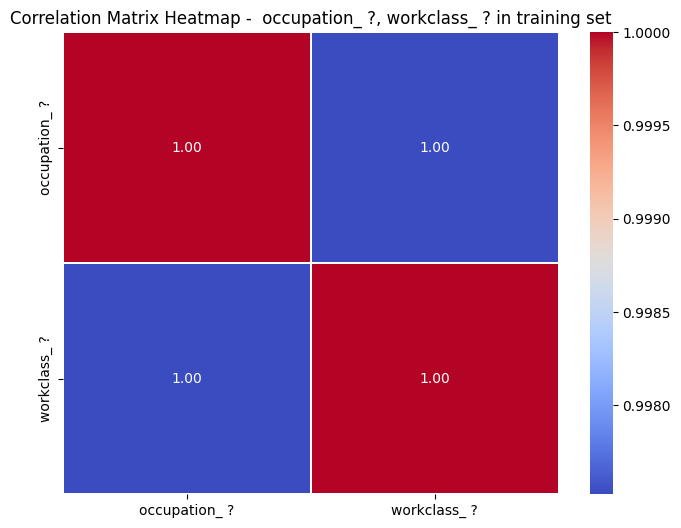

In [50]:
corr_matr_NAoccupation_NAworkclass= df_train[['occupation_ ?', 'workclass_ ?']].corr()

# Heatmap
plt.figure(figsize=(8, 6))
# cmap = colormap
# fmt = format string for the annotations
#".2f" =  floating-point numbers with two decimal places
#  linewidths = width of the lines that will divide each cell in the heatmap
sns.heatmap(corr_matr_NAoccupation_NAworkclass, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation Matrix Heatmap -  occupation_ ?, workclass_ ? in training set')
plt.show()


Whole correlation matrix:

In [51]:
corr_matr= df_train.corr()
print(corr_matr)

                                                 age    fnlwgt  education-num  \
age                                         1.000000 -0.074794       0.067628   
fnlwgt                                     -0.074794  1.000000      -0.034719   
education-num                               0.067628 -0.034719       1.000000   
capital-gain                                0.090520 -0.001116       0.140417   
capital-loss                                0.063577 -0.009820       0.093413   
hours-per-week                              0.061090 -0.010381       0.168673   
workclass_ ?                                0.025036 -0.007280      -0.091760   
workclass_ Federal-gov                      0.033590 -0.006899       0.036930   
workclass_ Local-gov                        0.025488  0.003103       0.068763   
workclass_ Never-worked                    -0.020951  0.004445      -0.015607   
workclass_ Private                         -0.215162  0.033151      -0.155373   
workclass_ Self-emp-inc     

In [52]:
# Searching for at least moderate correlations
# Filtering the correlation matrix to get values that exceed 0.3 or are less than -0.3
mod_high_corr = corr_matr[(corr_matr > 0.3) | (corr_matr < -0.3)]

# Removing self-correlations
np.fill_diagonal(mod_high_corr.values, np.nan)

# Printing the variable combinations that exceed the correlation thresholds
print("Variable combinations with correlation values exceeding 0.3 or below -0.3:")
mod_high_corr_pairs = mod_high_corr.stack().reset_index()
mod_high_corr_pairs.columns = ['Variable1', 'Variable2', 'Correlation']
mod_high_corr_pairs = mod_high_corr_pairs[mod_high_corr_pairs['Correlation'].notna()]

mod_high_corr_pairs

Variable combinations with correlation values exceeding 0.3 or below -0.3:


,Variable1,Variable2,Correlation
0,age,marital_status_ Never-married,-0.507094
1,age,relationship_ Own-child,-0.419510
2,education-num,education_ 7th-8th,-0.305785
3,education-num,education_ Bachelors,0.423742
4,education-num,education_ HS-grad,-0.339105
5,education-num,education_ Masters,0.318692
6,education-num,occupation_ Prof-specialty,0.372806
7,education-num,income_ >50K,0.370242
8,workclass_ ?,occupation_ ?,0.997525
9,workclass_ Private,workclass_ Self-emp-not-inc,-0.318727


occupation_ ? and workclass_  ?  are highly correlated with each other


In order to compare categories:

In [53]:
# Filtering columns that start with 'occupation'
occupation_columns = [col for col in df_train.columns if col.startswith('occupation')]

# Summing the values in the filtered columns
occupation_sums = df_train[occupation_columns].sum()

# Sorting the summed values in descending order
sorted_occupation_sums = occupation_sums.sort_values(ascending=False)

# Printing the results
print("Sum of values in columns starting with 'occupation', sorted in descending order:")
print(sorted_occupation_sums)

Sum of values in columns starting with 'occupation', sorted in descending order:
occupation_ Exec-managerial      3832
occupation_ Prof-specialty       3792
occupation_ Craft-repair         3094
occupation_ Sales                2862
occupation_ Adm-clerical         2637
occupation_ Other-service        2130
occupation_ Machine-op-inspct    1397
occupation_ ?                    1263
occupation_ Transport-moving     1157
occupation_ Handlers-cleaners     932
occupation_ Tech-support          691
occupation_ Farming-fishing       678
occupation_ Protective-serv       507
occupation_ Priv-house-serv       101
occupation_ Armed-Forces            6
dtype: int64


Since the number of NA values is not that far away from the mode (which occurs for the Exec-managerial category), I will leave the occupation_ ? column in the df. This is because the missing values still represent a significant portion of the data and can provide important information.

The modes changed between imbalanced and balanced sets.

In [54]:
# Filtering columns that start with 'workclass'
workclass_columns = [col for col in df_train.columns if col.startswith('workclass')]

# Summing the values in the filtered columns
workclass_sums = df_train[workclass_columns].sum()

# Sorting the summed values in descending order
sorted_workclass_sums = workclass_sums.sort_values(ascending=False)

# Printing the results
print("Sum of values in columns starting with 'workclass', sorted in descending order:")
print(sorted_workclass_sums)

Sum of values in columns starting with 'workclass', sorted in descending order:
workclass_ Private             19662
workclass_ Self-emp-not-inc     1942
workclass_ Local-gov            1636
workclass_ ?                    1257
workclass_ Self-emp-inc          976
workclass_ State-gov             976
workclass_ Federal-gov           766
workclass_ Without-pay            13
workclass_ Never-worked            6
dtype: int64


Since the mode (which occurs for the Private class) is much higher than the number of NA values, I will replace workclass=? with workclass=Private.

In [55]:
# Replacing 'workclass_ ?' with 'workclass_ Private'
df_train['workclass_ Private'] += df_train['workclass_ ?']
df_train.drop(columns=['workclass_ ?'], inplace=True)

In [56]:
df_train.columns

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week', 'workclass_ Federal-gov', 'workclass_ Local-gov',
       'workclass_ Never-worked', 'workclass_ Private',
       ...
       'native_country_ Puerto-Rico', 'native_country_ Scotland',
       'native_country_ South', 'native_country_ Taiwan',
       'native_country_ Thailand', 'native_country_ Trinadad&Tobago',
       'native_country_ United-States', 'native_country_ Vietnam',
       'native_country_ Yugoslavia', 'income_ >50K'],
      dtype='object', length=107)

In [57]:
# Calculating the new correlation matrix
corr_matr = df_train.corr()

# Converting the correlation matrix to a long format and resetting the index
corr_pairs = corr_matr.unstack().reset_index()
corr_pairs.columns = ['Variable1', 'Variable2', 'Correlation']

# Removing self-correlations
corr_pairs = corr_pairs[corr_pairs['Variable1'] != corr_pairs['Variable2']]

# Filtering correlations involving 'income_ >50K'
income_corr_pairs = corr_pairs[(corr_pairs['Variable1'] == 'income_ >50K') | (corr_pairs['Variable2'] == 'income_ >50K')]

# Sorting the correlations in descending order
sorted_corr_pairs = income_corr_pairs.sort_values(by='Correlation', ascending=False)

print("Sorted correlation values in descending order:")
sorted_corr_pairs

Sorted correlation values in descending order:


,Variable1,Variable2,Correlation
3530,marital_status_ Married-civ-spouse,income_ >50K,0.468421
11374,income_ >50K,marital_status_ Married-civ-spouse,0.468421
11394,income_ >50K,relationship_ Husband,0.376180
5670,relationship_ Husband,income_ >50K,0.376180
320,education-num,income_ >50K,0.370242
11344,income_ >50K,education-num,0.370242
106,age,income_ >50K,0.282772
11342,income_ >50K,age,0.282772
641,hours-per-week,income_ >50K,0.277353
11347,income_ >50K,hours-per-week,0.277353


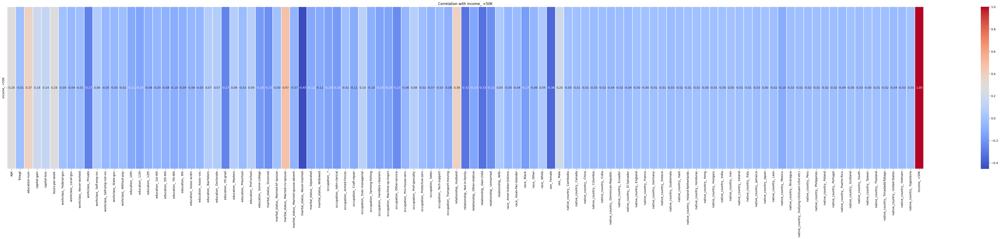

In [58]:
# Filtering the correlation matrix to only include rows and columns involving 'income_ >50K'
income_corr_matr = corr_matr[['income_ >50K']].T

# Plotting the heatmap
plt.figure(figsize=(70, 10))
sns.heatmap(income_corr_matr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.3)
plt.title('Correlation with income_ >50K')
plt.show()

Notice how different the correlations are between the imbalanced vs balanced set.

In [59]:
# Renaming columns to replace spaces with nothing '' and '-' with '_'
df_train.columns = df_train.columns.str.replace(' ', '').str.replace('-', '_')

In [60]:
print(list(df_train.columns))

['age', 'fnlwgt', 'education_num', 'capital_gain', 'capital_loss', 'hours_per_week', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay', 'education_10th', 'education_11th', 'education_12th', 'education_1st_4th', 'education_5th_6th', 'education_7th_8th', 'education_9th', 'education_Assoc_acdm', 'education_Assoc_voc', 'education_Bachelors', 'education_Doctorate', 'education_HS_grad', 'education_Masters', 'education_Preschool', 'education_Prof_school', 'education_Some_college', 'marital_status_Divorced', 'marital_status_Married_AF_spouse', 'marital_status_Married_civ_spouse', 'marital_status_Married_spouse_absent', 'marital_status_Never_married', 'marital_status_Separated', 'marital_status_Widowed', 'occupation_?', 'occupation_Adm_clerical', 'occupation_Armed_Forces', 'occupation_Craft_repair', 'occupation_Exec_managerial', 'occupation_Farming_

In [83]:
# List of columns to drop
columns_to_drop = ['fnlwgt', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay','education_Doctorate','marital_status_Never_married', 'occupation_Exec_managerial','relationship_Not_in_family', 'race_White','sex_Female', 'native_country_Cambodia', 'native_country_Canada', 'native_country_China', 'native_country_Columbia', 'native_country_Cuba', 'native_country_Dominican_Republic', 'native_country_Ecuador', 'native_country_El_Salvador', 'native_country_England', 'native_country_France', 'native_country_Germany', 'native_country_Greece', 'native_country_Guatemala', 'native_country_Haiti', 'native_country_Holand_Netherlands', 'native_country_Honduras', 'native_country_Hong', 'native_country_Hungary', 'native_country_India', 'native_country_Iran', 'native_country_Ireland', 'native_country_Italy', 'native_country_Jamaica', 'native_country_Japan', 'native_country_Laos', 'native_country_Mexico', 'native_country_Nicaragua', 'native_country_Outlying_US(Guam_USVI_etc)', 'native_country_Peru', 'native_country_Philippines', 'native_country_Poland', 'native_country_Portugal', 'native_country_Puerto_Rico', 'native_country_Scotland', 'native_country_South', 'native_country_Taiwan', 'native_country_Thailand', 'native_country_Trinadad&Tobago', 'native_country_United_States', 'native_country_Vietnam', 'native_country_Yugoslavia']

# Dropping the specified columns
df_train = df_train.drop(columns=columns_to_drop)

print(df_train)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



I'm dropping the same columns for the balanced and imbalanced sets for comparison purposes.

WARNING! I'm dropping 'occupation_Exec_managerial' which is the mode.

# Test set modification with accordance to train set

In [61]:
names= 'age, workclass, fnlwgt, education, education-num, marital-status, occupation, relationship, race, sex, capital-gain, capital-loss, hours-per-week, native-country, income'


In [62]:
col_names = names.split(', ')

In [63]:
col_names

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital-status',
 'occupation',
 'relationship',
 'race',
 'sex',
 'capital-gain',
 'capital-loss',
 'hours-per-week',
 'native-country',
 'income']

In [64]:
df_test = pd.read_csv('/content/drive/MyDrive/ML_final_project/adult_data_test.csv',names=col_names)

In [65]:
df_test.rename(columns={'marital-status': 'marital_status'}, inplace=True)

In [66]:
df_test.rename(columns={'native-country': 'native_country'}, inplace=True)

In [67]:
df_test = pd.get_dummies(df_test, columns=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'], prefix=['workclass', 'education', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'native_country', 'income'])

In [68]:
df_test.head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,education_ 10th,education_ 11th,education_ 12th,education_ 1st-4th,education_ 5th-6th,education_ 7th-8th,education_ 9th,education_ Assoc-acdm,education_ Assoc-voc,education_ Bachelors,education_ Doctorate,education_ HS-grad,education_ Masters,education_ Preschool,education_ Prof-school,education_ Some-college,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White,sex_ Female,sex_ Male,native_country_ ?,native_country_ Cambodia,native_country_ Canada,native_country_ China,native_country_ Columbia,native_country_ Cuba,native_country_ Dominican-Republic,native_country_ Ecuador,native_country_ El-Salvador,native_country_ England,native_country_ France,native_country_ Germany,native_country_ Greece,native_country_ Guatemala,native_country_ Haiti,native_country_ Honduras,native_country_ Hong,native_country_ Hungary,native_country_ India,native_country_ Iran,native_country_ Ireland,native_country_ Italy,native_country_ Jamaica,native_country_ Japan,native_country_ Laos,native_country_ Mexico,native_country_ Nicaragua,native_country_ Outlying-US(Guam-USVI-etc),native_country_ Peru,native_country_ Philippines,native_country_ Poland,native_country_ Portugal,native_country_ Puerto-Rico,native_country_ Scotland,native_country_ South,native_country_ Taiwan,native_country_ Thailand,native_country_ Trinadad&Tobago,native_country_ United-States,native_country_ Vietnam,native_country_ Yugoslavia,income_ <=50K.,income_ >50K.
0,25,226802,7,0,0,40,False,False,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
1,38,89814,9,0,0,50,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False
2,28,336951,12,0,0,40,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,F

In [69]:
df_test.shape

(16281, 109)

In [70]:
df_test.info() # test set < train set -> good

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16281 entries, 0 to 16280
Columns: 109 entries, age to income_ >50K.
dtypes: bool(103), int64(6)
memory usage: 2.3 MB


In [71]:
print(list(df_test.columns))

['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair',

In [72]:
df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Holand-Netherlands', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

KeyError: "['native_country_ Holand-Netherlands', 'income_ <=50K', 'income_ >50K'] not in index"

KeyError: "['native_country_ Holand-Netherlands', 'income_ <=50K', 'income_ >50K'] not in index" so I need to adjust those column names

It turns out that there is no 'native_country_Holand-Netherlands' column in the test set, as opposed to the train set.

Also, the income columns in the test set have dots in its names as opposed to train set.

In [73]:
df_test.rename(columns={'income_ <=50K.': 'income_ <=50K'}, inplace=True)
df_test.rename(columns={'income_ >50K.': 'income_ >50K'}, inplace=True)

In [74]:
df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']] = df_test[['workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'occupation_ ?', 'occupation_ Adm-clerical', 'occupation_ Armed-Forces', 'occupation_ Craft-repair', 'occupation_ Exec-managerial', 'occupation_ Farming-fishing', 'occupation_ Handlers-cleaners', 'occupation_ Machine-op-inspct', 'occupation_ Other-service', 'occupation_ Priv-house-serv', 'occupation_ Prof-specialty', 'occupation_ Protective-serv', 'occupation_ Sales', 'occupation_ Tech-support', 'occupation_ Transport-moving', 'relationship_ Husband', 'relationship_ Not-in-family', 'relationship_ Other-relative', 'relationship_ Own-child', 'relationship_ Unmarried', 'relationship_ Wife', 'race_ Amer-Indian-Eskimo', 'race_ Asian-Pac-Islander', 'race_ Black', 'race_ Other', 'race_ White', 'sex_ Female', 'sex_ Male', 'native_country_ ?', 'native_country_ Cambodia', 'native_country_ Canada', 'native_country_ China', 'native_country_ Columbia', 'native_country_ Cuba', 'native_country_ Dominican-Republic', 'native_country_ Ecuador', 'native_country_ El-Salvador', 'native_country_ England', 'native_country_ France', 'native_country_ Germany', 'native_country_ Greece', 'native_country_ Guatemala', 'native_country_ Haiti', 'native_country_ Honduras', 'native_country_ Hong', 'native_country_ Hungary', 'native_country_ India', 'native_country_ Iran', 'native_country_ Ireland', 'native_country_ Italy', 'native_country_ Jamaica', 'native_country_ Japan', 'native_country_ Laos', 'native_country_ Mexico', 'native_country_ Nicaragua', 'native_country_ Outlying-US(Guam-USVI-etc)', 'native_country_ Peru', 'native_country_ Philippines', 'native_country_ Poland', 'native_country_ Portugal', 'native_country_ Puerto-Rico', 'native_country_ Scotland', 'native_country_ South', 'native_country_ Taiwan', 'native_country_ Thailand', 'native_country_ Trinadad&Tobago', 'native_country_ United-States', 'native_country_ Vietnam', 'native_country_ Yugoslavia', 'income_ <=50K', 'income_ >50K']].astype(int)

In [75]:
df_test = df_test.drop('income_ <=50K', axis = 1)

In [76]:
# Dropping rows where native_country_ ? is 1
df_test = df_test[df_test['native_country_ ?'] != 1]

# Resetting index after dropping rows
df_test.reset_index(drop=True, inplace=True)

df_test.drop(columns=['native_country_ ?'], inplace=True)

<ipython-input-76-75665c47badc>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test.drop(columns=['native_country_ ?'], inplace=True)


In [77]:
# Replacing 'workclass_ ?' with 'workclass_ Private'
df_test['workclass_ Private'] += df_test['workclass_ ?']
df_test.drop(columns=['workclass_ ?'], inplace=True)

In [78]:
# Renaming columns to replace spaces with nothing '' and '-' with '_'
df_test.columns = df_test.columns.str.replace(' ', '').str.replace('-', '_')

In [79]:
# List of columns to drop
columns_to_drop_test = ['fnlwgt', 'workclass_Federal_gov', 'workclass_Local_gov', 'workclass_Never_worked', 'workclass_Private', 'workclass_Self_emp_inc', 'workclass_Self_emp_not_inc', 'workclass_State_gov', 'workclass_Without_pay','education_Doctorate','marital_status_Never_married', 'occupation_Exec_managerial','relationship_Not_in_family', 'race_White','sex_Female', 'native_country_Cambodia', 'native_country_Canada', 'native_country_China', 'native_country_Columbia', 'native_country_Cuba', 'native_country_Dominican_Republic', 'native_country_Ecuador', 'native_country_El_Salvador', 'native_country_England', 'native_country_France', 'native_country_Germany', 'native_country_Greece', 'native_country_Guatemala', 'native_country_Haiti', 'native_country_Honduras', 'native_country_Hong', 'native_country_Hungary', 'native_country_India', 'native_country_Iran', 'native_country_Ireland', 'native_country_Italy', 'native_country_Jamaica', 'native_country_Japan', 'native_country_Laos', 'native_country_Mexico', 'native_country_Nicaragua', 'native_country_Outlying_US(Guam_USVI_etc)', 'native_country_Peru', 'native_country_Philippines', 'native_country_Poland', 'native_country_Portugal', 'native_country_Puerto_Rico', 'native_country_Scotland', 'native_country_South', 'native_country_Taiwan', 'native_country_Thailand', 'native_country_Trinadad&Tobago', 'native_country_United_States', 'native_country_Vietnam', 'native_country_Yugoslavia']

# Dropping the specified columns
df_test = df_test.drop(columns=columns_to_drop_test)

print(df_test)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



# Models

In [84]:
# Setting a seed for the random number generator
seed = 42

# Randomizing all observations in df_train
df_train = df_train.sample(frac=1, random_state=seed).reset_index(drop=True) # reset_index(drop=True) resets the index of the DataFrame to the default integer index and drop=True prevents the old indices from being added as a new column in the DataFrame.

# Randomizing all observations in df_test
df_test = df_test.sample(frac=1, random_state=seed).reset_index(drop=True)


In [85]:
X_train = df_train.drop('income_>50K', axis=1)
X_test = df_test.drop('income_>50K', axis=1)
y_train = df_train['income_>50K']
y_test =  df_test['income_>50K']

Logistic Regression:

In [86]:
model_log = LogisticRegression(max_iter=1000)

model_log.fit(X_train, y_train)

predictions_log = model_log.predict(X_test)

accuracy_log = accuracy_score(y_test, predictions_log)
print("Accuracy:", accuracy_log)

Accuracy: 0.8282001624289373


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [87]:
# Calculating and printing the metrics
accuracy_log = accuracy_score(y_test, predictions_log)
precision_log = precision_score(y_test, predictions_log)
recall_log = recall_score(y_test, predictions_log)
f1_log = f1_score(y_test, predictions_log)

print(f'Accuracy: {accuracy_log}')
print(f'Precision: {precision_log}')
print(f'Recall: {recall_log}')
print(f'F1 Score: {f1_log}')

Accuracy: 0.8282001624289373
Precision: 0.6166134185303515
Recall: 0.7163308589607635
F1 Score: 0.6627422124110867


KNN:

In [88]:
model_knn = KNeighborsClassifier(n_neighbors=5)

model_knn.fit(X_train, y_train)

predictions_knn = model_knn.predict(X_test)

accuracy_knn = accuracy_score(y_test, predictions_knn)
print("KNN Accuracy:", accuracy_knn)

KNN Accuracy: 0.795089648278878


In [89]:
# Calculating and printing the metrics
accuracy_knn = accuracy_score(y_test, predictions_knn)
precision_knn = precision_score(y_test, predictions_knn)
recall_knn = recall_score(y_test, predictions_knn)
f1_knn = f1_score(y_test, predictions_knn)

print(f'Accuracy: {accuracy_knn}')
print(f'Precision: {precision_knn}')
print(f'Recall: {recall_knn}')
print(f'F1 Score: {f1_knn}')

Accuracy: 0.795089648278878
Precision: 0.5444524756053487
Recall: 0.7987804878048781
F1 Score: 0.6475392220073072


Random Forest and SVM:

In [90]:
# Training RandomForestClassifier
model_rf = RandomForestClassifier()
model_rf.fit(X_train, y_train)
predictions_rf = model_rf.predict(X_test)

# Training SVM
model_svm = SVC()
model_svm.fit(X_train, y_train)
predictions_svm = model_svm.predict(X_test)

In [91]:
# Evaluating the models
def evaluate_model(y_test, y_pred):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    return accuracy, precision, recall, f1

# RandomForest metrics
rf_metrics = evaluate_model(y_test, predictions_rf)
print(f"RandomForest - Accuracy: {rf_metrics[0]}, Precision: {rf_metrics[1]}, Recall: {rf_metrics[2]}, F1 Score: {rf_metrics[3]}")

# SVM metrics
svm_metrics = evaluate_model(y_test, predictions_svm)
print(f"SVM - Accuracy: {svm_metrics[0]}, Precision: {svm_metrics[1]}, Recall: {svm_metrics[2]}, F1 Score: {svm_metrics[3]}")

RandomForest - Accuracy: 0.8265758730555383, Precision: 0.613594890510949, Recall: 0.7131495227995758, F1 Score: 0.6596370769985288
SVM - Accuracy: 0.7985256450302992, Precision: 0.6628945801072067, Recall: 0.29506892895015907, F1 Score: 0.4083654375343974


y mean:

In [92]:
# Calculating the mean of the 'income_>50K' column
mean_income_test = df_test['income_>50K'].mean()

print("Mean of income_>50K:", mean_income_test) # this can be the baseline to determine whether the accuracy is good

Mean of income_>50K: 0.23564690447929032


Classification reports:

In [93]:
print('------------------ Classification report: Logistic regression ------------------ \n ')
print(classification_report(y_test, predictions_log))
print('\n')
print('------------------ Classification report: KNN ------------------ \n ')
print(classification_report(y_test, predictions_knn))
print('\n')
print('------------------ Classification report: Random forest ------------------ \n ')
print(classification_report(y_test, predictions_rf))
print('\n')
print('------------------ Classification report: SVM ------------------ \n ')
print(classification_report(y_test, predictions_svm))
print('\n')

------------------ Classification report: Logistic regression ------------------ 
 
              precision    recall  f1-score   support

           0       0.91      0.86      0.88     12235
           1       0.62      0.72      0.66      3772

    accuracy                           0.83     16007
   macro avg       0.76      0.79      0.77     16007
weighted avg       0.84      0.83      0.83     16007



------------------ Classification report: KNN ------------------ 
 
              precision    recall  f1-score   support

           0       0.93      0.79      0.86     12235
           1       0.54      0.80      0.65      3772

    accuracy                           0.80     16007
   macro avg       0.74      0.80      0.75     16007
weighted avg       0.84      0.80      0.81     16007



------------------ Classification report: Random forest ------------------ 
 
              precision    recall  f1-score   support

           0       0.91      0.86      0.88     12235
   

Confusion matrices:

In [94]:
print('------------------ Confusion matrix: Logistic regression ------------------ \n ')
print(pd.crosstab(y_test, predictions_log,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: KNN ------------------ \n ')
print(pd.crosstab(y_test, predictions_knn,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: Random forest ------------------ \n ')
print(pd.crosstab(y_test, predictions_rf,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')
print('------------------ Confusion matrix: SVM ------------------ \n ')
print(pd.crosstab(y_test, predictions_svm,
                  rownames=['Actual'], colnames=['Predicted'],
                  margins = True))
print('\n')

------------------ Confusion matrix: Logistic regression ------------------ 
 
Predicted      0     1    All
Actual                       
0          10555  1680  12235
1           1070  2702   3772
All        11625  4382  16007


------------------ Confusion matrix: KNN ------------------ 
 
Predicted      0     1    All
Actual                       
0           9714  2521  12235
1            759  3013   3772
All        10473  5534  16007


------------------ Confusion matrix: Random forest ------------------ 
 
Predicted      0     1    All
Actual                       
0          10541  1694  12235
1           1082  2690   3772
All        11623  4384  16007


------------------ Confusion matrix: SVM ------------------ 
 
Predicted      0     1    All
Actual                       
0          11669   566  12235
1           2659  1113   3772
All        14328  1679  16007


